In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Import Ruiwu's helper functions for data cleaning, slicing and aggregating
import sys
sys.path.append(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU')
from helper_functions import *

full_dataset = r"C:\Frank\UoT 2024-2025\MIE8888 Project\full_dataset_2.11.csv"
df = pd.read_csv(full_dataset, encoding="Windows-1252")

C:\Users\frank\AppData\Local\Temp\ipykernel_3816\1856405710.py:11: DtypeWarning: Columns (1,4,10,16,52,85,86,91) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(full_dataset, encoding="Windows-1252")


# Feature Preprocessing

In [7]:
trash_columns = ['id_x_x','sikka_sub_task_operation_x_x','office_x_x','guarantor_x','patient','description','visible_to_patient','primary_insurance_estimate','secondary_insurance_estimate','plan_sr_no','insurance_payment','approved','from_pms_x_x','id_y_x','from_pms_y_x','sikka_sub_task_y_x','sikka_sub_task_operation_y_x','uuid','guarantor_y','office_y_x','fullname','first_name','last_name','address','phone','zip_code','practice','primary_insurance_company_id','profile_picture','date_joined','zip_code_flag','address_comp','final_zip_code','id_x_y','from_pms_x_y','office_x_y','treatment','id_y_y','from_pms_y_y','sikka_sub_task_y_y','sikka_sub_task_operation_y_y','office_y_y','procedure_code_x','procedure_code_description','patient_friendly_description','treatment_id','price','fetched_zip_code_flag','zip_code_verified','fetched_zip_code', 'entry_date', 'tooth_from']

In [8]:
df = drop_high_nan_columns(df) 
df = df.drop(columns = trash_columns) # Drop trash cols
df = merge_columns_with_priority(df,'health_category','procedure_code_category','treatment_category') # merge to get treatment_category with pattern from two category groups
df = df.dropna() # Drop the remaining NA
df, df_dict = object_processing(df) # Project columns dtype = object; For columns containing datetime, convert it to pd.datetime; For other object columns, encode them

# age group preparation (modify to int)
df = days_cal(df,'procedure_date','birth_date', 'procedure_age')
df = days_cal(df,'last_visit','first_visit','visit_period')

C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: 

In [9]:
# Perform one-hot encoding on the "procedure_code_y" and "treatment_category"
df = one_hot_encode_procedure_and_treatment(df)
# df.to_csv(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\output.csv', index=False)

In [10]:
df_next = df.copy()

In [11]:
# Step 0: Patient-level metadata columns
meta_cols = [
    'provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city',
    'state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 
    'procedure_age', 'visit_period'
]

# Step 1: Select relevant columns
base_cols = ['patient_id', 'procedure_age']
procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_')]
df_subset = df_next[base_cols + procedure_cols].copy()

# Step 2: Round procedure_age to int
df_subset['procedure_age'] = df_subset['procedure_age'].astype(int)

# Step 3: Melt one-hot to long format
df_long = df_subset.melt(
    id_vars=['patient_id', 'procedure_age'],
    value_vars=procedure_cols,
    var_name='procedure_code',
    value_name='occurred'
)

# Step 4: Keep only rows where procedure occurred
df_long = df_long[df_long['occurred'] == 1]

# Step 5: Create combined feature name
df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)

# Step 6: Pivot to wide format
final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0)
final_df[final_df > 0] = 1  # Make sure it's binary

# Step 7: Reset index
final_df = final_df.reset_index()

# Step 8: Get patient-level metadata (take first row per patient)
patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()

# Step 9: Merge metadata with wide format
final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')


In [12]:
final_df

,patient_id,provider_x,amount,treatment_plan_status,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,procedure_code_y_99555_age74,procedure_code_y_99555_age75,procedure_code_y_99555_age76,procedure_code_y_99555_age77,procedure_code_y_99555_age78,procedure_code_y_99555_age79,procedure_code_y_99555_age81,procedure_code_y_99555_age83,procedure_code_y_99555_age86,procedure_code_y_99555_age87
0,1,1,663.00,1,0,0,0,43.818875,-79.559466,55,...,0,0,0,0,0,0,0,0,0,0
1,2,7,77.19,0,0,0,0,43.818875,-79.559466,41,...,0,0,0,0,0,0,0,0,0,0
2,3,5,19.96,0,0,0,0,43.818875,-79.559466,24,...,0,0,0,0,0,0,0,0,0,0
3,4,7,55.49,0,0,0,0,43.835469,-79.555076,15,...,0,0,0,0,0,0,0,0,0,0
4,5,1,220.00,1,0,0,0,43.818875,-79.559466,20,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,10,8.75,1,0,0,0,43.838741,-79.563329,10,...,0,0,0,0,0,0,0,0,0,0
10254,13580,10,30.15,1,0,0,0,43.838741,-79.563329,6,...,0,0,0,0,0,0,0,0,0,0
10255,13583,11,160.14,0,12,0,0,43.840925,-79.551739,8,...,0,0,0,0,0,0,0,0,0,0
10256,13584,2,0.00,2,9,0,2,43.671953,-79.399170,39,...,0,0,0,0,0,0,0,0,0,0


Applied Truncated SVD which is the best for sparse binary data of large sparse matrices.

In [13]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# Step 1: Identify columns to exclude from SVD
non_binary_cols = [
    'provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city',
    'state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE',
    'procedure_age', 'visit_period'
]

# Step 2: Split metadata and binary feature matrix
meta_df = final_df[non_binary_cols].copy()
binary_df = final_df.drop(columns=non_binary_cols)

# Step 3: Apply TruncatedSVD on binary columns only
X_sparse = csr_matrix(binary_df.values)
svd = TruncatedSVD(n_components=100, random_state=42)
X_svd = svd.fit_transform(X_sparse)

# Step 4: Wrap into DataFrame
svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])

# Step 5: Combine metadata and reduced features
df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)

In [14]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55,...,-0.409695,-0.408300,0.009028,0.050484,0.176222,-0.171479,-0.715060,0.488255,0.236866,-0.523177
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41,...,-0.103007,0.275067,0.081947,0.111606,-0.263882,0.205289,-0.019829,-0.011507,0.482313,0.314602
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24,...,0.404986,0.129388,-0.196940,-0.360430,-0.082495,-0.002331,-0.291152,0.417049,0.123490,-0.315173
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15,...,-0.262801,-0.317441,-0.160186,0.105370,-0.140870,-0.581573,0.526628,-0.507412,-0.042675,-0.208865
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20,...,-0.134252,-0.326106,0.034053,-0.165582,-0.124809,0.044672,0.095241,0.153833,-0.292738,-0.284694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10,...,0.072704,-0.000644,-0.024968,0.022108,-0.069808,-0.045898,-0.016383,0.039160,-0.005736,-0.021719
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6,...,-0.020115,0.021277,0.001165,0.016239,0.054706,-0.007929,0.012063,-0.004707,0.015785,0.027152
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8,...,-0.014900,0.033883,-0.006680,-0.005078,-0.005625,-0.009464,0.019263,0.020158,-0.007497,-0.015593
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39,...,0.000750,-0.000316,0.000114,0.001497,-0.002364,-0.001101,0.000921,0.002275,-0.002185,-0.001976


In [ ]:
def age_to_group(age):
    try:
        age = int(age)
        if age < 0:
            return "invalid"
        lower = (age // 5) * 5
        upper = lower + 5
        if lower > upper:
            return "invalid"
        return f"{lower}-{upper}"
    except:
        return "invalid"

df['age_group'] = df['procedure_age'].apply(age_to_group)

In [7]:
df

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,age_group
0,0,25.22,0,6672,0,0,0,43.804948,-79.555954,12,...,False,False,False,False,False,False,False,False,False,10-15
1,0,32.96,0,6672,0,0,0,43.804948,-79.555954,12,...,False,False,False,False,False,False,False,False,False,10-15
2,0,47.09,0,6672,0,0,0,43.804948,-79.555954,12,...,False,False,False,False,False,False,False,False,False,10-15
3,0,21.36,0,6672,0,0,0,43.804948,-79.555954,12,...,False,False,False,False,False,False,False,False,False,10-15
4,1,57.10,0,2479,1,0,0,43.761221,-79.687745,68,...,False,False,False,False,False,False,False,False,False,65-70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354032,1,25.22,0,7997,15,0,0,43.670184,-79.517310,8,...,False,False,False,False,False,False,False,False,False,5-10
354033,1,96.26,0,7997,15,0,0,43.670184,-79.517310,8,...,False,False,False,False,False,False,False,False,False,5-10
354034,4,23.66,0,3107,0,0,0,43.801319,-79.564734,46,...,False,False,False,False,False,False,False,False,False,45-50
354035,3,87.06,0,2679,0,0,0,43.852601,-79.561398,20,...,False,False,False,False,False,False,False,False,False,20-25


In [8]:
import os
# Create output directory if it doesn't exist
output_dir = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe"
os.makedirs(output_dir, exist_ok=True)

# Split and save each group
for group_name, group_df in df.groupby('age_group'):
    filename = f"{output_dir}/age_group_{group_name}.csv"
    group_df.to_csv(filename, index=False)
    print(f"Saved: {filename}")

Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_0-5.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_10-15.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_15-20.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_20-25.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_25-30.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_30-35.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_35-40.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_40-45.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_45-50.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_5-10.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_50-55.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split d

In [ ]:
# Load 30–35 group file
df_30_35  = pd.read_csv(r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe\age_group_30-35.csv")

# Step 1: Filter binary columns only (procedure + treatment)
binary_cols = [col for col in df_30_35 .columns if (col.startswith('procedure_code_y_') or col.startswith('treatment_category_'))]

# Step 2: Group by patient and aggregate with sum → then binarize
agg_binary = df_30_35 .groupby("patient_id")[binary_cols].sum()
# Result: each row is a patient, each column is a 0/1 binary indicating if that treatment occurred

# Combine each patient's SVD "fingerprint" with their age-group treatments
df_combined = pd.merge(agg_binary, df_svd, on='patient_id', how='left') # keep all patients from your age group (and match SVD if available)


In [43]:
from sklearn.cluster import AgglomerativeClustering

# Step 1: Extract the SVD feature columns
svd_cols = [col for col in df_combined.columns if col.startswith("SVD_")]
X = df_combined[svd_cols]

# Step 2: Run Agglomerative Clustering
clustering = AgglomerativeClustering(n_clusters=6)
cluster_labels = clustering.fit_predict(X)

# Step 3: Add the cluster label to the DataFrame
df_combined['cluster_label'] = cluster_labels

In [44]:
df_combined

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100,cluster_label
0,4,0,0,0,0,0,0,0,0,0,...,-0.317441,-0.160186,0.105370,-0.140870,-0.581573,0.526628,-0.507412,-0.042675,-0.208865,4
1,9,0,0,0,1,0,0,0,0,0,...,-0.142807,-0.120522,0.070151,0.220390,-0.008765,0.002276,0.124690,-0.053132,0.054960,0
2,10,0,0,0,1,0,0,0,0,0,...,-0.145646,0.028903,0.188305,0.327919,-0.386018,0.280597,0.202896,-0.265363,0.449370,0
3,15,0,0,0,0,0,0,0,0,0,...,-0.366349,-0.061225,0.085123,-0.116408,-0.068424,-0.323976,0.405106,-0.042163,0.004073,1
4,16,0,0,0,0,0,0,0,0,0,...,0.136450,0.362196,0.156249,0.156696,0.268257,0.288193,-0.426365,-0.021902,-0.219137,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273,13457,0,0,0,1,0,0,0,0,0,...,-0.152537,-0.043392,0.029684,0.095920,-0.026375,-0.051686,0.082611,-0.211699,-0.023009,1
2274,13458,0,0,0,1,0,0,0,0,0,...,-0.086372,-0.277699,0.115263,-0.092720,0.144559,-0.214391,0.043858,0.122487,-0.127730,1
2275,13497,0,0,0,1,0,0,0,0,0,...,-0.128316,-0.122951,0.068784,0.041371,-0.074488,0.051828,0.180968,0.025867,-0.160104,1
2276,13523,0,0,0,3,0,0,0,0,0,...,-0.094463,-0.184923,-0.057237,0.035983,-0.077151,-0.002352,0.061573,0.162716,-0.104978,1


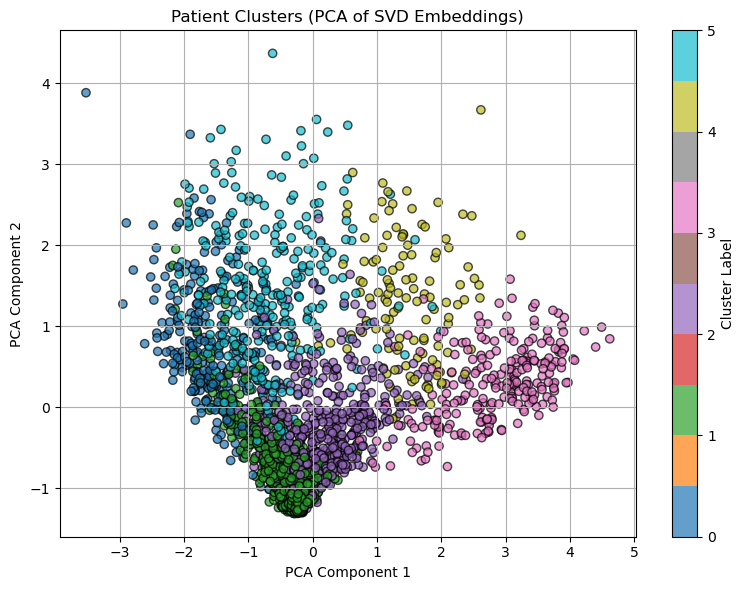

In [45]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Step 1: Get SVD columns
svd_cols = [col for col in df_combined.columns if col.startswith("SVD_")]

# Step 2: Prepare SVD matrix
X = df_combined[svd_cols].values

# Step 3: Reduce to 2D using PCA
pca = PCA(n_components=2)
X_2d = pca.fit_transform(X)

# Step 4: Plot the clusters
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    X_2d[:, 0], X_2d[:, 1],
    c=df_combined['cluster_label'],  # use cluster labels to color points
    cmap='tab10', edgecolor='k', alpha=0.7
)
plt.title("Patient Clusters (PCA of SVD Embeddings)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(scatter, label="Cluster Label")
plt.grid(True)
plt.tight_layout()
plt.show()


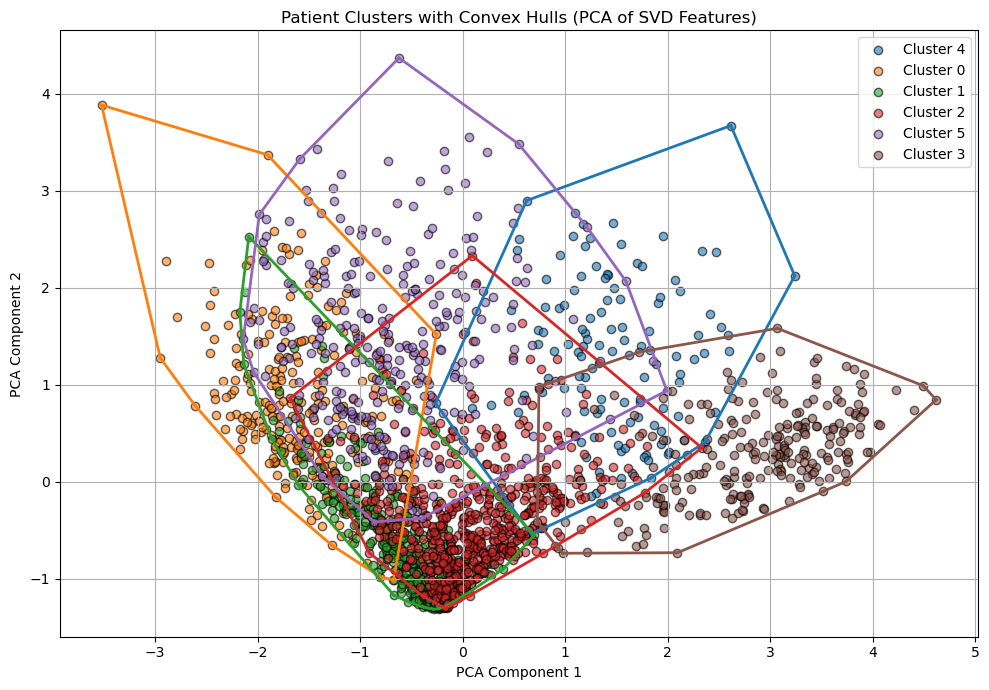

In [46]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull
import numpy as np

# Step 1: Extract SVD features
svd_cols = [col for col in df_combined.columns if col.startswith("SVD_")]
X = df_combined[svd_cols].values

# Step 2: Reduce to 2D using PCA
pca = PCA(n_components=2)
X_2d = pca.fit_transform(X)
df_combined['PCA1'] = X_2d[:, 0]
df_combined['PCA2'] = X_2d[:, 1]

# Step 3: Plot clusters and their convex hulls
plt.figure(figsize=(10, 7))
unique_clusters = df_combined['cluster_label'].unique()
colors = plt.cm.tab10.colors

for i, cluster_id in enumerate(unique_clusters):
    cluster_points = df_combined[df_combined['cluster_label'] == cluster_id][['PCA1', 'PCA2']].values
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_id}', color=colors[i % len(colors)], alpha=0.6, edgecolor='k')
    
    # Draw convex hull around cluster
    if len(cluster_points) >= 3:  # convex hull needs at least 3 points
        hull = ConvexHull(cluster_points)
        for simplex in hull.simplices:
            plt.plot(cluster_points[simplex, 0], cluster_points[simplex, 1], color=colors[i % len(colors)], linewidth=2)

plt.title("Patient Clusters with Convex Hulls (PCA of SVD Features)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
